In [1]:
import numpy as np
import scanpy as sc
import scvelo as scv
import sys
import torch
import matplotlib.pyplot as plt
import umap
import os
sys.path.append('../')
import multivelovae as vv
from datetime import datetime

In [2]:
torch.cuda.is_available()

True

In [3]:
now = datetime.now()
date = now.strftime("%m_%d_%Y")

In [4]:
dataset = "8964-KL-1"
adata = sc.read_h5ad('../../RNA_ATAC/8964-KL-1/8964-KL-1_adata_postpro.h5ad')
adata_atac = sc.read_h5ad('../../RNA_ATAC/8964-KL-1/8964-KL-1_adata_atac_postpro.h5ad')

In [5]:
model_path_base = f"checkpoints/{dataset}"
figure_path_base = f"figures/{dataset}"
data_path_base = f"data/{dataset}"

In [6]:
gene_plot = ['NANOG', 'ESRG', 'DPPA4', 'GRID2', 'TPBG', 'PAX6', 'ENC1', 'SAT1']
np.all(np.isin(gene_plot, adata.var_names))

True

In [7]:
adata_atac.layers['Mc'] = adata_atac.layers['Mc'].A

In [8]:
adata, adata_atac

(AnnData object with n_obs × n_vars = 4240 × 3138
     obs: 'total_unspliced', 'total_spliced', 'log1p_total_unspliced', 'log1p_total_spliced', 'fraction_u', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_hla', 'log1p_total_counts_hla', 'pct_counts_hla', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'S_score', 'G2M_score', 'phase', 'CC_difference', 'total_unspliced2', 'total_spliced2', 'log1p_total_unspliced2', 'log1p_total_spliced2', 'fraction_u2', 'n_c', 'n_Mu', 'n_Ms', 'leiden'
     var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rb', 'hla', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gene_coun

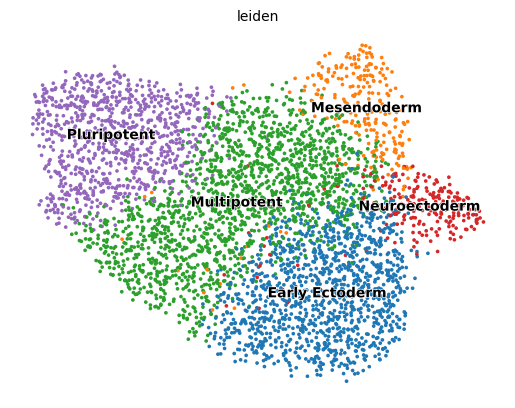

In [9]:
os.makedirs(figure_path_base, exist_ok=True)
scv.pl.scatter(adata, basis='umap', color='leiden')

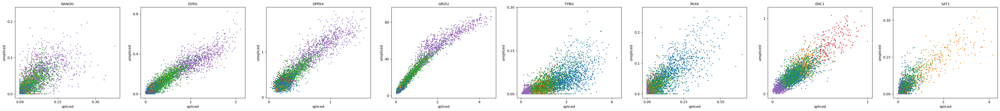

In [10]:
scv.pl.scatter(adata, basis=gene_plot, color='leiden')

In [11]:
figure_path = figure_path_base+'/'+date
model_path = model_path_base+'/'+date
data_path = data_path_base

In [12]:
key = 'vae'

In [13]:
torch.manual_seed(2022)
np.random.seed(2022)
model = vv.VAEChrom(adata,
                    adata_atac,
                    device='cuda:0',
                    plot_init=False,
                    gene_plot=gene_plot,
                    cluster_key="leiden",
                    figure_path=figure_path,
                    embed="umap")

model.train(plot=False,
            gene_plot=gene_plot,
            figure_path=figure_path,
            embed="umap"
            )

model.save_model(model_path)
model.save_anndata(data_path, file_name="out.h5ad")

Latent dimension set to 16.
Learning rate set to 9.1e-4 based on data sparsity.
Early stop threshold set to 1.6.
Using Gaussian Prior.
Initializing using the steady-state and dynamical models.


  0%|          | 0/3138 [00:00<?, ?it/s]

2613 out of 3138 = 83.3% genes have good ellipse fits.
KS-test result: [1. 1. 1. 1. 1. 1. 1.]
Assigning cluster 6 to repressive.
Initial induction: 2532, repression: 606 out of 3138.
-------------------------- Train a MultiVeloVAE -------------------------
*********      Creating Training and Validation Datasets      *********
Total Number of Iterations Per Epoch: 12, test iteration: 22
*********                      Finished.                      *********
*********                      Stage  1                       *********
Epoch 1: Train ELBO = -21489.391, Test ELBO = -250868.052		Total Time =   0 h :  0 m :  0 s
Epoch 50: Train ELBO = 14445.737, Test ELBO = 14370.251		Total Time =   0 h :  0 m :  7 s
Epoch 100: Train ELBO = 16401.478, Test ELBO = 16270.854		Total Time =   0 h :  0 m : 15 s
Epoch 150: Train ELBO = 16905.745, Test ELBO = 16748.806		Total Time =   0 h :  0 m : 22 s
Epoch 200: Train ELBO = 17068.374, Test ELBO = 16926.925		Total Time =   0 h :  0 m : 29 s
Epoch 250: 

  0%|          | 0/4240 [00:00<?, ?it/s]

Percentage of Invalid Sets: 0.004
Average Set Size: 17
Finished. Actual Time:   0 h :  0 m :  3 s
*********             Velocity Refinement Round 1             *********
Epoch 678: Train ELBO = 17250.644, Test ELBO = 17073.383		Total Time =   0 h :  1 m : 42 s
*********     Round 1: Early Stop Triggered at epoch 678.     *********
*********     Retrieving best model from iteration 8120.      *********
Cell-wise KNN estimation.
Finished. Actual Time:   0 h :  0 m :  0 s
*********             Velocity Refinement Round 2             *********
Epoch 694: Train ELBO = 17221.109, Test ELBO = 17035.956		Total Time =   0 h :  1 m : 46 s
*********     Round 2: Early Stop Triggered at epoch 694.     *********
*********     Retrieving best model from iteration 8307.      *********
Change in x0: 0.110
Cell-wise KNN estimation.
Finished. Actual Time:   0 h :  0 m :  0 s
*********             Velocity Refinement Round 3             *********
Epoch 706: Train ELBO = 17217.978, Test ELBO = 17019.916		

In [14]:
std_z = adata.obsm[f"{key}_std_z"]
z = adata.obsm[f"{key}_z"]

In [15]:
umap_obj = umap.UMAP(n_neighbors=30, n_components=2, min_dist=0.25, random_state=2022)
z_umap = umap_obj.fit_transform(z)

In [16]:
adata.obsm['X_z_umap'] = z_umap

computing velocity graph (using 1/8 cores)


  0%|          | 0/4240 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'vae_velocity_norm_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'vae_velocity_norm_umap', embedded velocity vectors (adata.obsm)


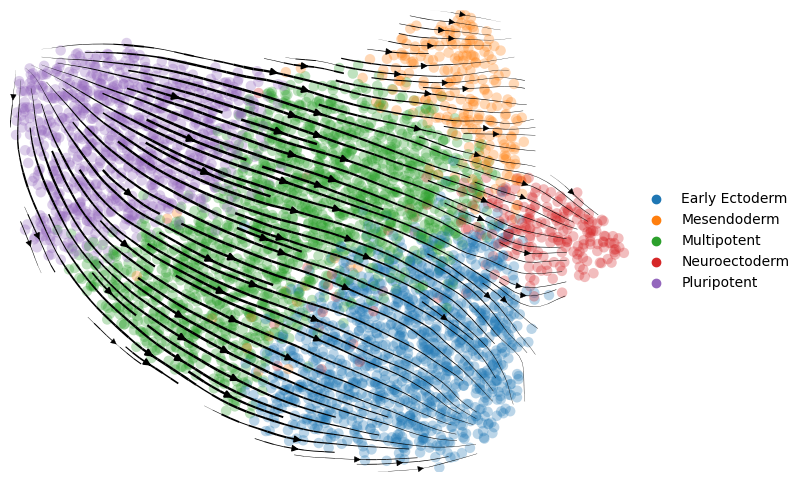

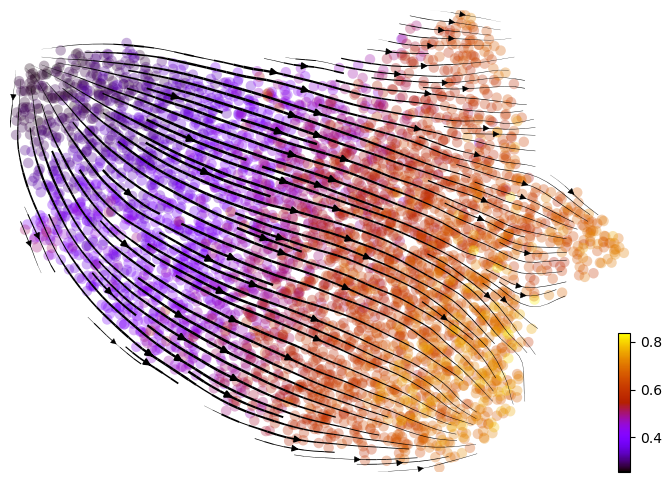

In [17]:
vv.model.velocity_graph(adata, key=key)
vv.velocity_embedding_stream(adata, key=key, basis='umap', color='leiden', title="", figsize=(8,6), legend_loc='right margin')
vv.velocity_embedding_stream(adata, key=key, basis='umap', color=f'{key}_time', color_map='gnuplot', title="", figsize=(8,6), legend_loc='right margin')

computing velocity embedding
    finished (0:00:00) --> added
    'vae_velocity_norm_z_umap', embedded velocity vectors (adata.obsm)


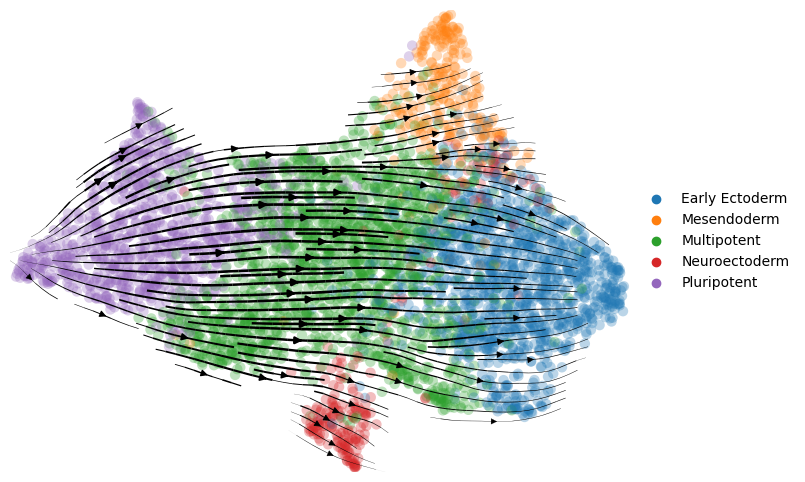

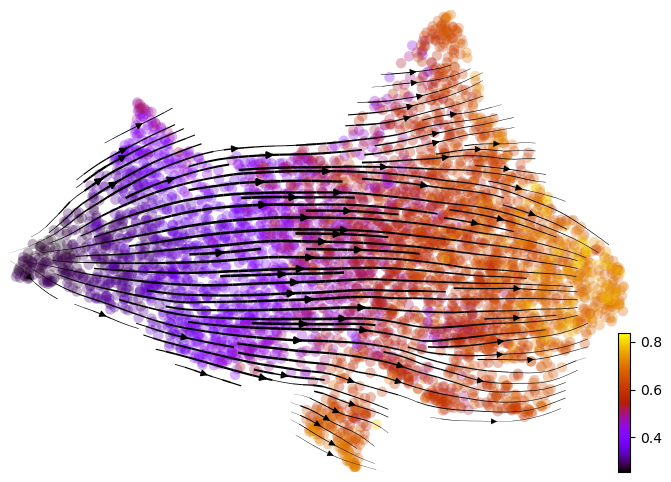

In [18]:
vv.velocity_embedding_stream(adata, key=key, basis='z_umap', color='leiden', title="", figsize=(8,6), legend_loc='right margin')
vv.velocity_embedding_stream(adata, key=key, basis='z_umap', color=f'{key}_time', color_map='gnuplot', title="", figsize=(8,6), legend_loc='right margin')

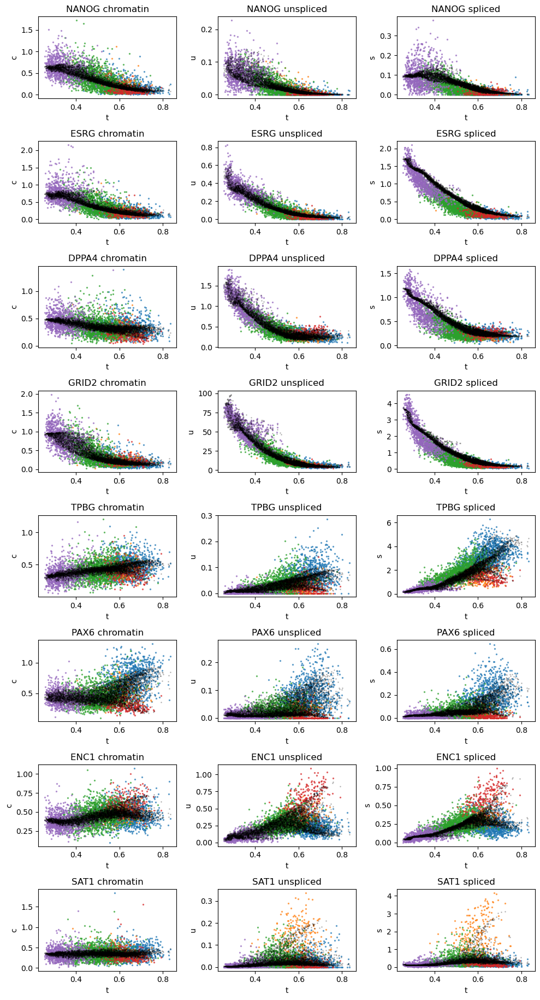

In [19]:
vv.dynamic_plot(adata, adata_atac, gene_plot, key=key, color_by='leiden')

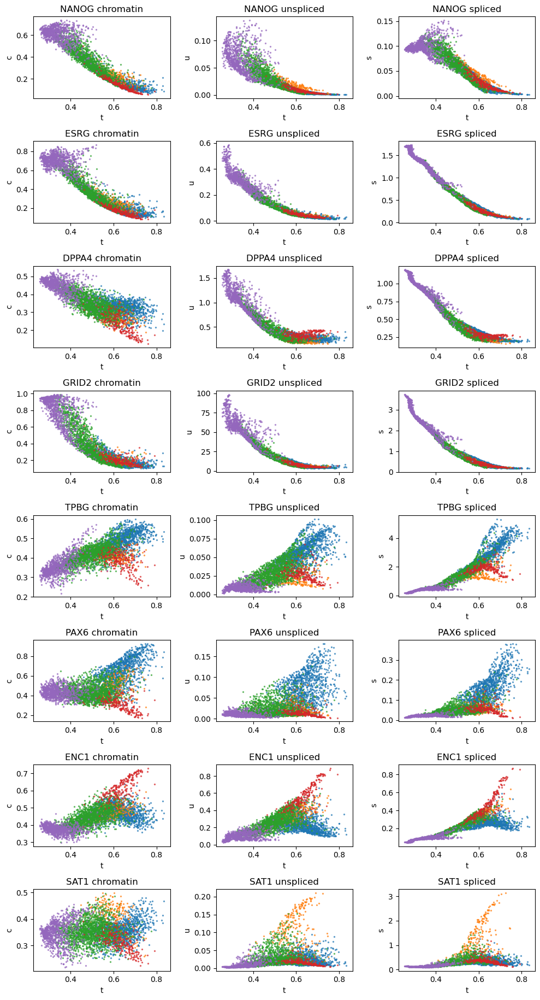

In [20]:
vv.dynamic_plot(adata, adata_atac, gene_plot, key=key, color_by='leiden', show_pred_only=True)

In [21]:
adata.layers['velocity_normalized'] = adata.layers[f'{key}_velocity'] / np.max(np.abs(adata.layers[f'{key}_velocity']), axis=0)

In [22]:
a = np.isin(adata.obs['leiden'], ['Early Ectoderm'])
b = np.isin(adata.obs['leiden'], ['Mesendoderm', 'Neuroectoderm'])

In [23]:
df_dd_ = vv.model.differential_dynamics(adata, adata_atac, model=model, idx1=a, idx2=b, mode='change')

In [24]:
import matplotlib.colors as mcolors

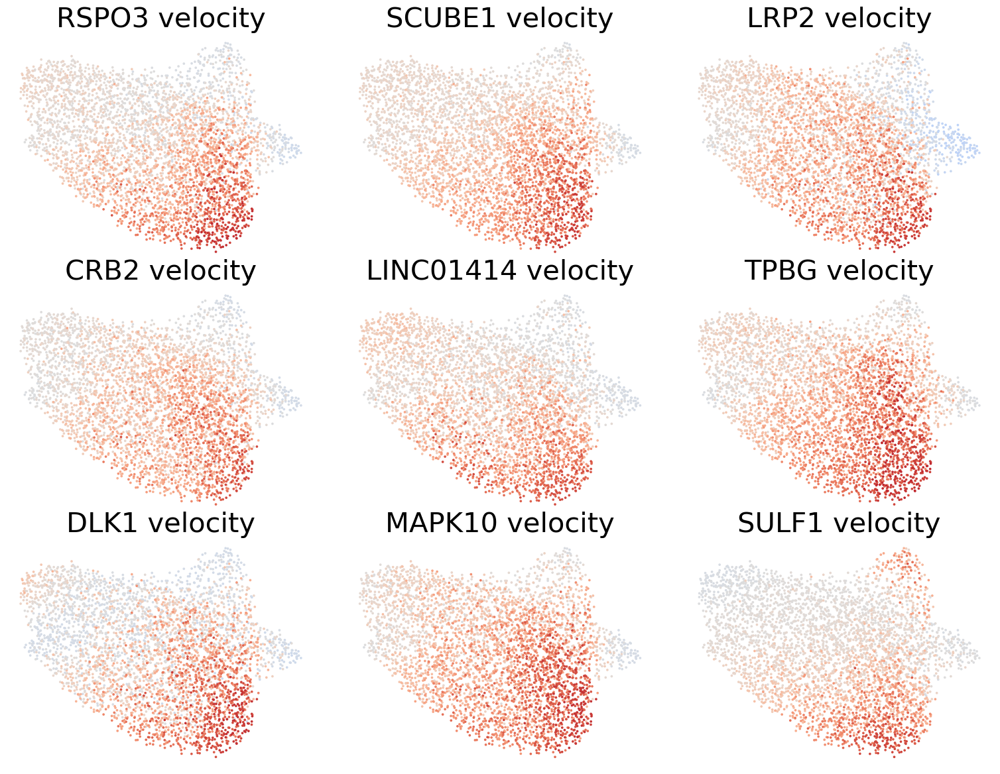

In [ ]:
genes = df_dd_.sort_values(by=['bayes_factor_v', 'log2_diff_v'], ascending=[False, False])[df_dd_['log2_diff_v']>0].index[:9]
scv.pl.scatter(adata, basis='umap', layer='velocity_normalized', color=genes, title=[x+' velocity' for x in genes], frameon=False, ncols=3, colorbar=False, wspace=0.1, hspace=0.1,
               fontsize=30, color_map='coolwarm', norm=mcolors.CenteredNorm(halfrange=1))

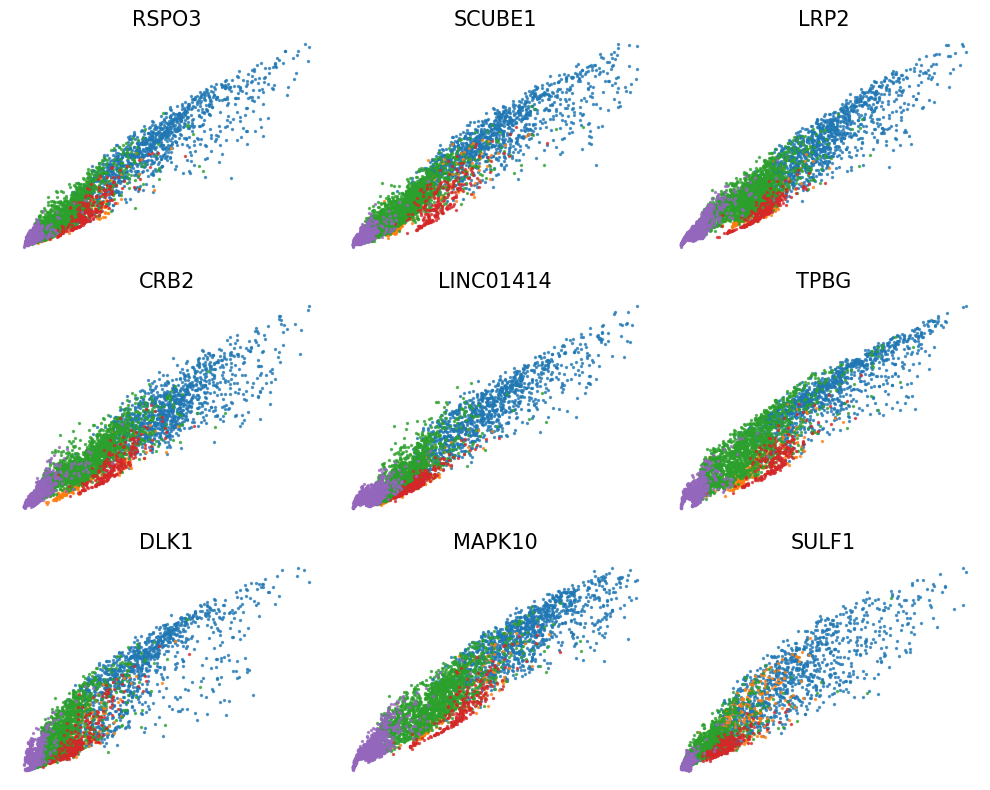

In [26]:
vv.scatter_plot(adata, adata_atac, genes, color_by='leiden', show_pred_only=True, axis_on=False, frame_on=False, n_cols=3, figsize=(10,8), fontsize=15)

In [27]:
a = np.isin(adata.obs['leiden'], ['Mesendoderm'])
b = np.isin(adata.obs['leiden'], ['Early Ectoderm', 'Neuroectoderm'])

In [28]:
df_dd_ = vv.model.differential_dynamics(adata, adata_atac, model=model, idx1=a, idx2=b, mode='change')

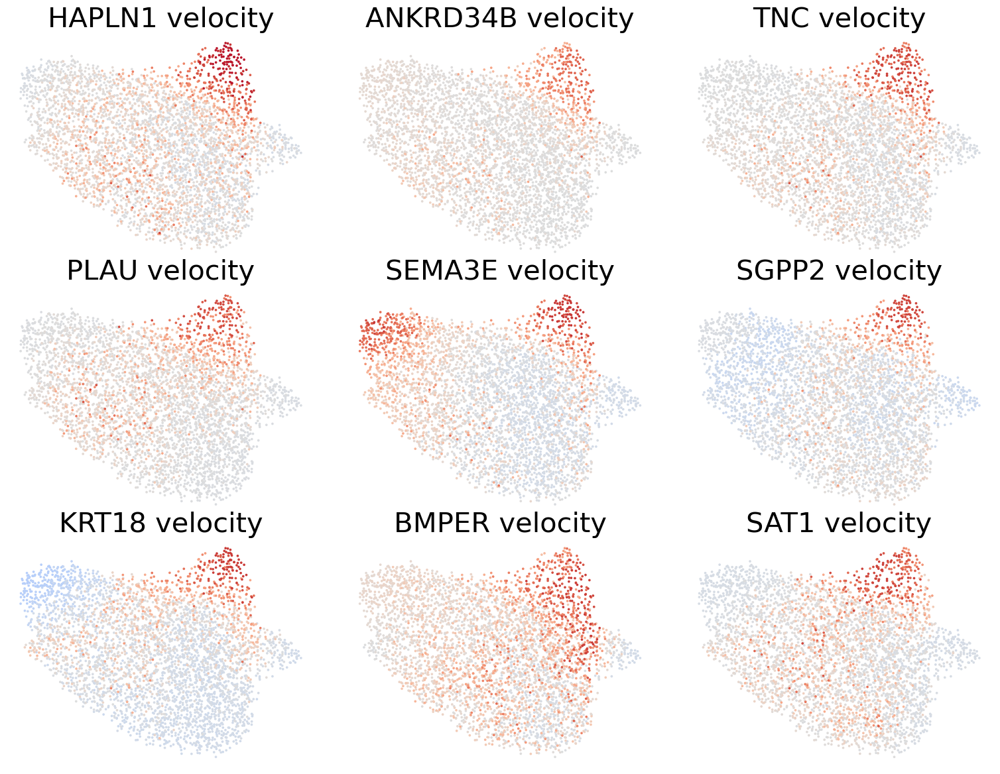

In [ ]:
genes = df_dd_.sort_values(by=['bayes_factor_v', 'log2_diff_v'], ascending=[False, False])[df_dd_['log2_diff_v']>0].index[:9]
scv.pl.scatter(adata, basis='umap', layer='velocity_normalized', color=genes, title=[x+' velocity' for x in genes], frameon=False, ncols=3, colorbar=False, wspace=0.1, hspace=0.1,
               fontsize=30, color_map='coolwarm', norm=mcolors.CenteredNorm(halfrange=1))

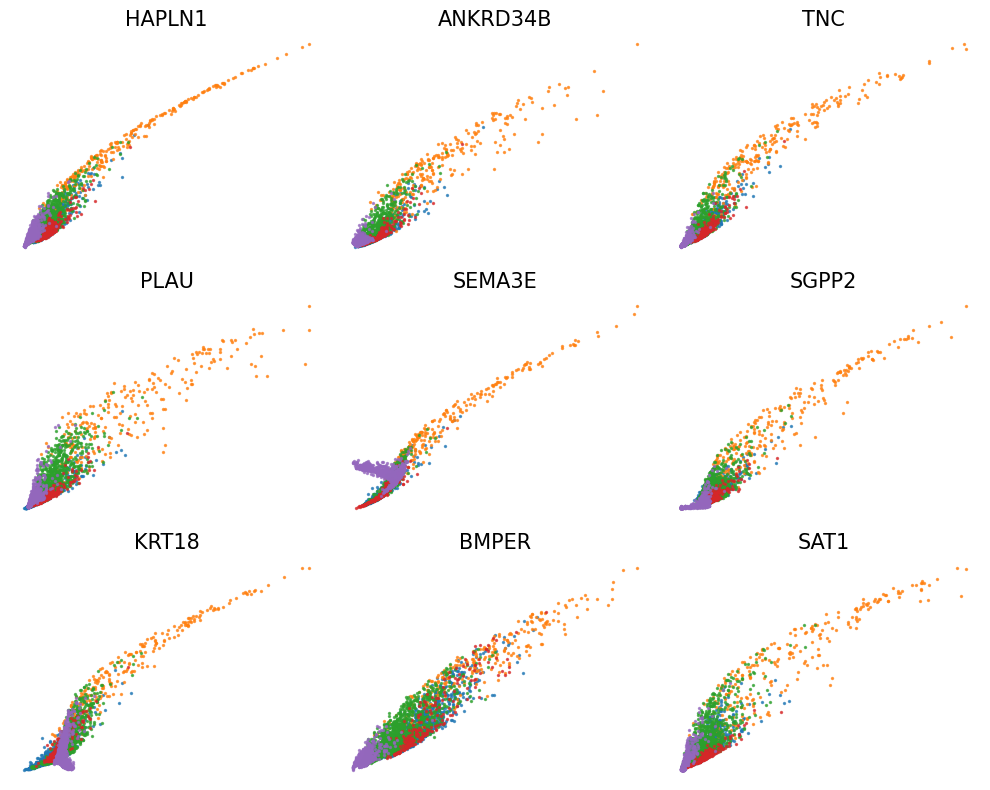

In [30]:
vv.scatter_plot(adata, adata_atac, genes, color_by='leiden', show_pred_only=True, axis_on=False, frame_on=False, n_cols=3, figsize=(10,8), fontsize=15)

In [31]:
a = np.isin(adata.obs['leiden'], ['Neuroectoderm'])
b = np.isin(adata.obs['leiden'], ['Mesendoderm', 'Early Ectoderm'])

In [32]:
df_dd_ = vv.model.differential_dynamics(adata, adata_atac, model=model, idx1=a, idx2=b, mode='change')

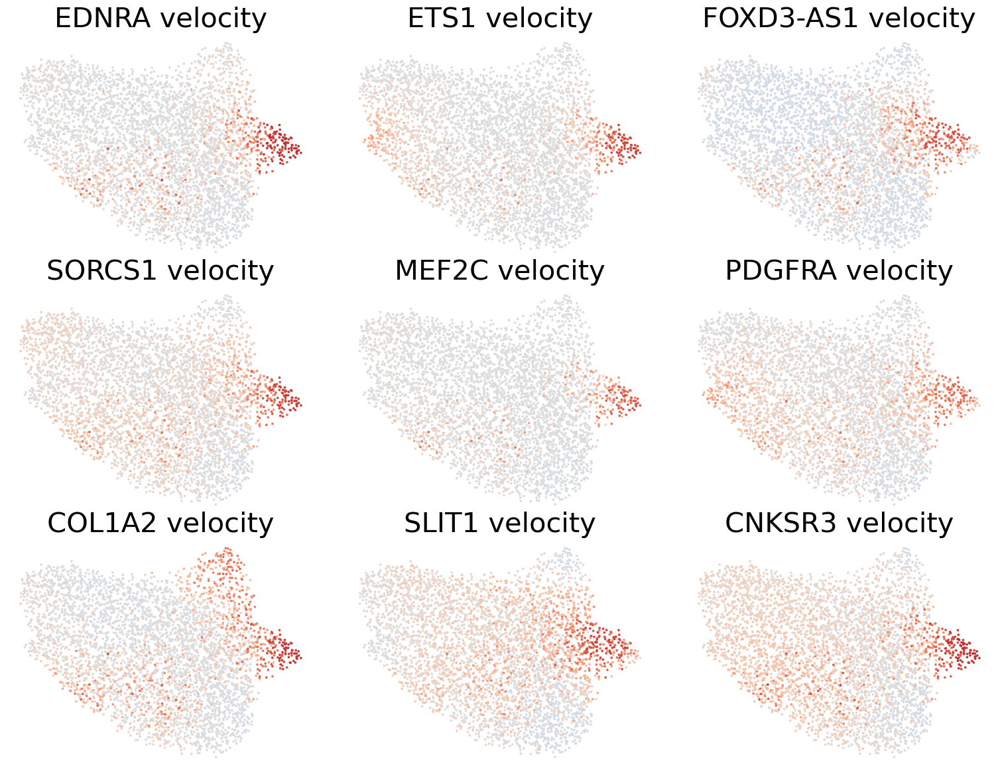

In [ ]:
genes = df_dd_.sort_values(by=['bayes_factor_v', 'log2_diff_v'], ascending=[False, False])[df_dd_['log2_diff_v']>0].index[:9]
scv.pl.scatter(adata, basis='umap', layer='velocity_normalized', color=genes, title=[x+' velocity' for x in genes], frameon=False, ncols=3, colorbar=False, wspace=0.1, hspace=0.1,
               fontsize=30, color_map='coolwarm', norm=mcolors.CenteredNorm(halfrange=1))

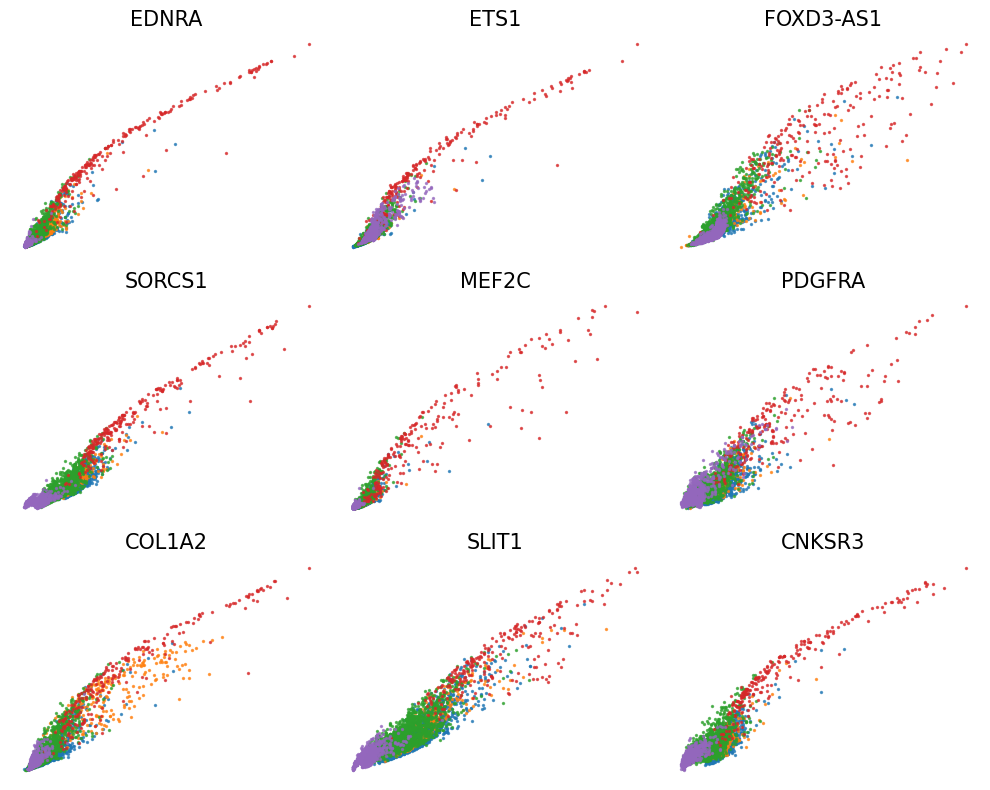

In [34]:
vv.scatter_plot(adata, adata_atac, genes, color_by='leiden', show_pred_only=True, axis_on=False, frame_on=False, n_cols=3, figsize=(10,8), fontsize=15)

In [35]:
top_genes = adata[:, adata.var[f'{key}_velocity_genes']].var[f'{key}_likelihood'].sort_values(ascending=False).index

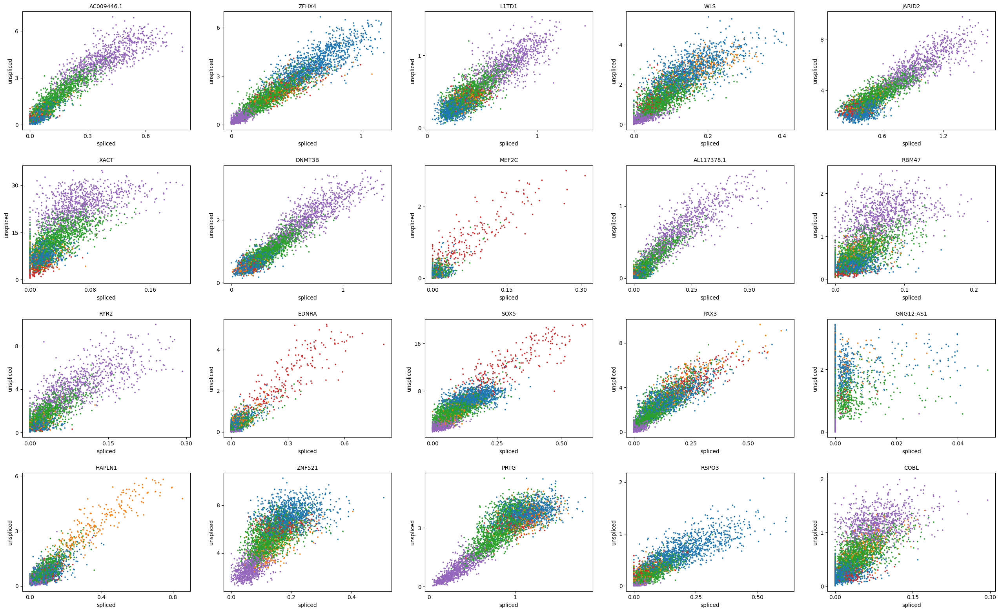

In [36]:
scv.pl.scatter(adata, basis=top_genes[:20], color='leiden', ncols=5)

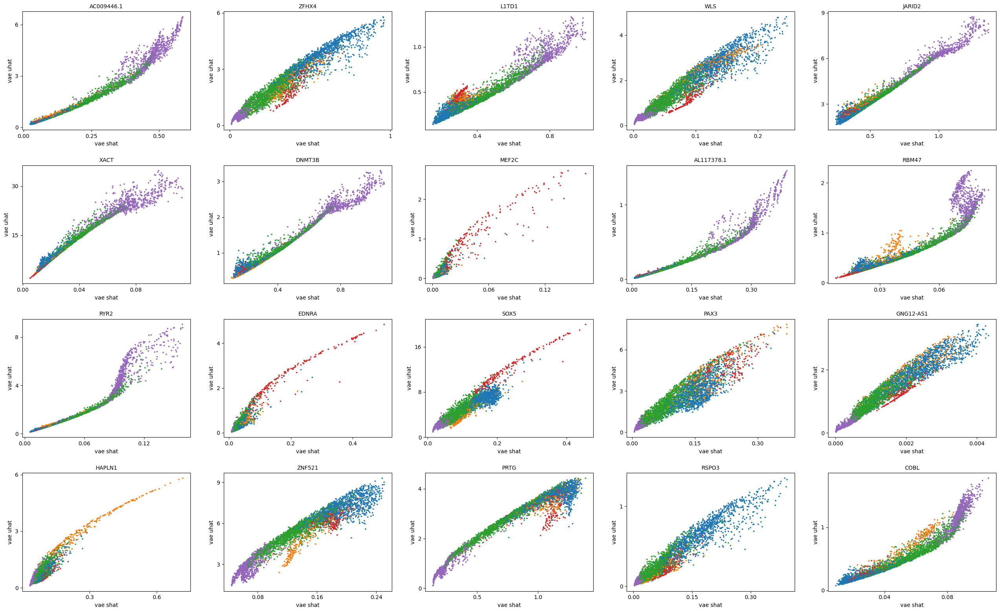

In [37]:
scv.pl.scatter(adata, basis=top_genes[:20], x=f'{key}_shat', y=f'{key}_uhat', color='leiden', ncols=5)

In [38]:
adata.layers['Mc'] = adata_atac.layers['Mc'].copy()

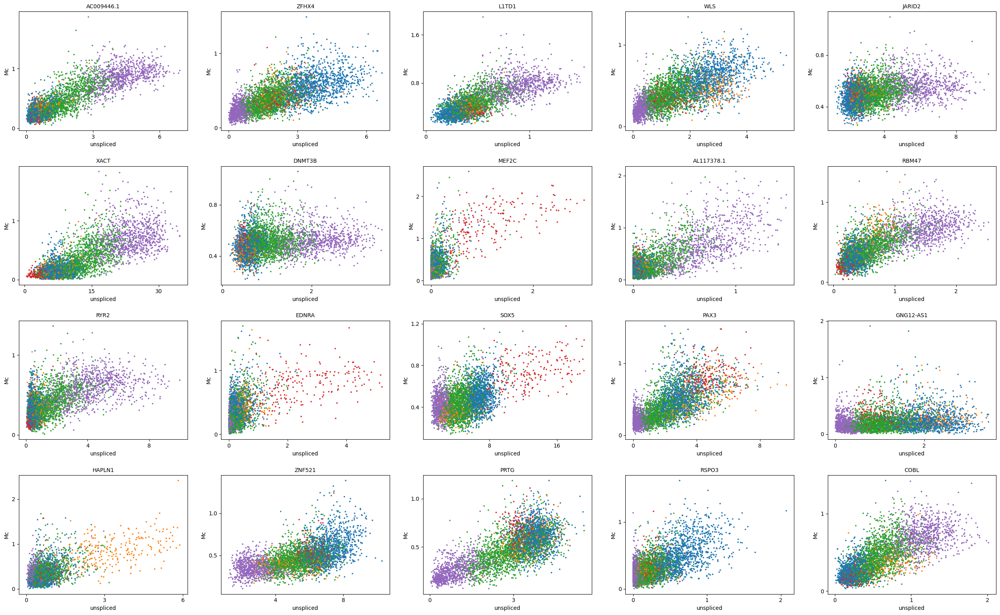

In [39]:
scv.pl.scatter(adata, x='Mu', y='Mc', basis=top_genes[:20], color='leiden', ncols=5)

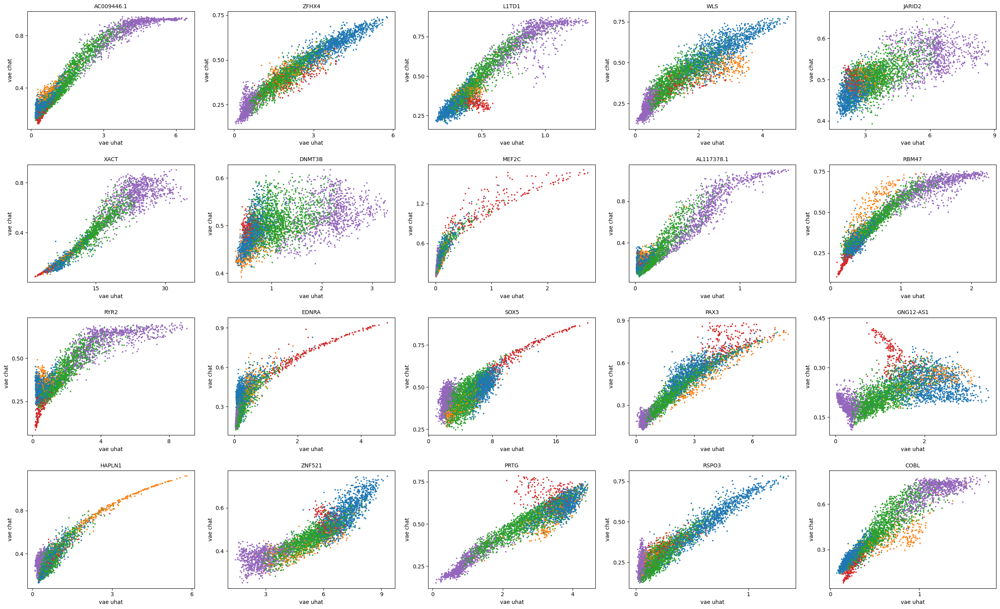

In [40]:
scv.pl.scatter(adata, basis=top_genes[:20], x=f'{key}_uhat', y=f'{key}_chat', color='leiden', ncols=5)

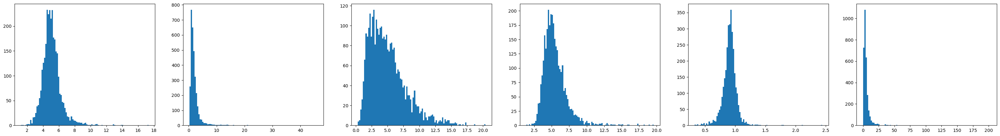

In [41]:
fig, axs = plt.subplots(1, 6, figsize=(40, 5))
axs[0].hist(adata.var[f'{key}_alpha_c'], bins=100);
axs[1].hist(adata.var[f'{key}_alpha'], bins=100);
axs[2].hist(adata.var[f'{key}_beta'], bins=100);
axs[3].hist(adata.var[f'{key}_gamma'], bins=100);
axs[4].hist(adata.var[f'{key}_scaling_c'], bins=100);
axs[5].hist(adata.var[f'{key}_scaling_u'], bins=100);

In [42]:
adata.write_h5ad(data_path_base+"/final.h5ad")